<a href="https://colab.research.google.com/github/anoohyabhaskarla/INFO_5731/blob/main/Bhaskarla_Anoohya_Assignment_03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **INFO5731 Assignment 3**

In this assignment, we will delve into various aspects of natural language processing (NLP) and text analysis. The tasks are designed to deepen your understanding of key NLP concepts and techniques, as well as to provide hands-on experience with practical applications.

Through these tasks, you'll gain practical experience in NLP techniques such as N-gram analysis, TF-IDF, word embedding model creation, and sentiment analysis dataset creation.

**Expectations**:
*   Use the provided .*ipynb* document to write your code & respond to the questions. Avoid generating a new file.
*   Write complete answers and run all the cells before submission.
*   Make sure the submission is "clean"; *i.e.*, no unnecessary code cells.
*   Once finished, allow shared rights from top right corner (*see Canvas for details*).


**Total points**: 100

**Deadline**: See Canvas

**Late Submission will have a penalty of 10% reduction for each day after the deadline.**


## Question 1 (30 points)

**Understand N-gram**

Write a python program to conduct N-gram analysis based on the dataset in your assignment two. You need to write codes from **scratch instead of using any pre-existing libraries** to do so:

(1) Count the frequency of all the N-grams (N=3) and (N=2).

(2) Calculate the probabilities for all the bigrams in the dataset by using the formula  count(w2 w1) / count(w2). For example, count(really like) / count(really) = 1 / 3 = 0.33.

(3) Extract all the noun phrases and calculate the relative
probabilities of each review in terms of other reviews (abstracts, or tweets) by using the formula  frequency (noun phrase) / max frequency (noun phrase) on the whole dataset.

Print out the result in a table with column name the all the noun phrases and row name as all the 100 reviews (abstracts, or tweets).

In [15]:
import re
from collections import Counter
import pandas as pd

# Load dataset
file_path = "narrators_data.csv"
df = pd.read_csv(file_path)
# write your code here
# Function to clean and tokenize text (no external libraries)
def tokenize(text):
    # Convert text to lowercase and split by spaces (simple tokenization)
    text = text.lower()
    tokens = text.split()
    return tokens

# Function to generate N-grams
def generate_ngrams(tokens, n):
    return [tuple(tokens[i:i+n]) for i in range(len(tokens)-n+1)]

# (1) Count frequency of all the N-grams (N=3)
def count_ngrams(data, n):
    ngram_counts = {}
    for review in data:
        tokens = tokenize(review)
        ngrams = generate_ngrams(tokens, n)
        for ngram in ngrams:
            if ngram in ngram_counts:
                ngram_counts[ngram] += 1
            else:
                ngram_counts[ngram] = 1
    return ngram_counts

# (2) Calculate probabilities for all the bigrams
def calculate_bigram_probabilities(data):
    bigram_counts = {}
    unigram_counts = {}

    for review in data:
        tokens = tokenize(review)
        unigrams = generate_ngrams(tokens, 1)
        bigrams = generate_ngrams(tokens, 2)

        # Count unigrams
        for unigram in unigrams:
            if unigram in unigram_counts:
                unigram_counts[unigram] += 1
            else:
                unigram_counts[unigram] = 1

        # Count bigrams
        for bigram in bigrams:
            if bigram in bigram_counts:
                bigram_counts[bigram] += 1
            else:
                bigram_counts[bigram] = 1

    bigram_probabilities = {}
    for bigram in bigram_counts:
        first_word = bigram[0]
        if (first_word,) in unigram_counts:  # Probability formula
            bigram_probabilities[bigram] = bigram_counts[bigram] / unigram_counts[(first_word,)]
        else:
            bigram_probabilities[bigram] = 0  # In case the unigram count is zero

    return bigram_probabilities

# (3) Extract noun phrases (simple extraction)
def extract_noun_phrases(data):
    noun_phrases = {}
    for review in data:
        tokens = tokenize(review)
        review_noun_phrases = set()  # To ensure each noun phrase is counted only once per review
        for i in range(len(tokens) - 1):
            # Simple pattern: article (the, a, an) followed by a noun or adjective
            if tokens[i] in ['the', 'a', 'an', 'this', 'that', 'these', 'those']:
                phrase = tokens[i] + " " + tokens[i+1]
                review_noun_phrases.add(phrase)  # Add to set (unique within the review)
        for phrase in review_noun_phrases:  # Add the unique noun phrases of the review to the global count
            if phrase in noun_phrases:
                noun_phrases[phrase] += 1
            else:
                noun_phrases[phrase] = 1
    return noun_phrases
# (3) Calculate relative probabilities of noun phrases
def calculate_relative_probabilities(noun_phrases, data):
    max_count = max(noun_phrases.values()) if noun_phrases else 1
    relative_probs = []

    for review in data:
        review_phrases = {}
        tokens = tokenize(review)
        for i in range(len(tokens) - 1):
            phrase = tokens[i] + " " + tokens[i+1]
            if phrase in noun_phrases:
                if phrase in review_phrases:
                    review_phrases[phrase] += 1
                else:
                    review_phrases[phrase] = 1
        # Calculate relative probabilities (frequency / max frequency)
        relative_probs.append({phrase: count / max_count for phrase, count in review_phrases.items()})
    return relative_probs

# (3) Create a table of relative probabilities for noun phrases
def create_noun_phrase_table(relative_probabilities, noun_phrases):
    unique_phrases = sorted(set(noun_phrases.keys()))  # Unique noun phrases as columns
    table_headers = unique_phrases  # Columns for noun phrases
    table = {phrase: [0] * len(data) for phrase in table_headers}  # Initialize table with noun phrases as columns

    for idx, prob in enumerate(relative_probabilities):
        for phrase, probability in prob.items():
            table[phrase][idx] = probability

    table_with_reviews = []
    for review_idx in range(len(data)):
        row = [f"Review {review_idx + 1}"] + [table[phrase][review_idx] for phrase in table_headers]
        table_with_reviews.append(row)

    return table_with_reviews, table_headers


# Main execution
# (1) Count 3-grams
three_gram_counts = count_ngrams(data, 3)

# (2) Calculate bigram probabilities
bigram_probabilities = calculate_bigram_probabilities(data)

# (3) Extract noun phrases
noun_phrase_counts = extract_noun_phrases(data)

# Calculate relative probabilities of noun phrases for each review
relative_probabilities = calculate_relative_probabilities(noun_phrase_counts, data)

# Create a table for noun phrase relative probabilities
noun_phrase_table, headers = create_noun_phrase_table(relative_probabilities, noun_phrase_counts)

# Display results
print("3-gram Counts:")
for ngram, count in three_gram_counts.items():
    print(f"{ngram}: {count}")

print("\nBigram Probabilities:")
for bigram, probability in bigram_probabilities.items():
    print(f"{bigram}: {probability:.2f}")

# Print Noun Phrase Relative Probabilities Table
print("\nNoun Phrase Relative Probabilities Table:")
print(f"{'Review':<20} " + " ".join(f"{phrase:<20}" for phrase in headers))  # Print column headers

# Print each row of probabilities
for row in noun_phrase_table:
    print("        ".join(f"{float(item):.2f}" if isinstance(item, (int, float)) else str(item) for item in row))




3-gram Counts:
('nisei', 'female.', 'born'): 286
('female.', 'born', 'may'): 41
('born', 'may', '9,'): 5
('may', '9,', '1927,'): 1
('9,', '1927,', 'in'): 2
('1927,', 'in', 'selleck,'): 1
('in', 'selleck,', 'washington.'): 3
('selleck,', 'washington.', 'spent'): 1
('washington.', 'spent', 'much'): 2
('spent', 'much', 'of'): 2
('much', 'of', 'childhood'): 2
('of', 'childhood', 'in'): 5
('childhood', 'in', 'beaverton,'): 1
('in', 'beaverton,', 'oregon,'): 2
('beaverton,', 'oregon,', 'where'): 2
('oregon,', 'where', 'father'): 4
('where', 'father', 'owned'): 8
('father', 'owned', 'a'): 3
('owned', 'a', 'farm.'): 1
('a', 'farm.', 'influenced'): 1
('farm.', 'influenced', 'at'): 1
('influenced', 'at', 'an'): 1
('at', 'an', 'early'): 14
('an', 'early', '…'): 1
('nisei', 'male.', 'born'): 373
('male.', 'born', 'june'): 39
('born', 'june', '12,'): 1
('june', '12,', '1921,'): 1
('12,', '1921,', 'in'): 3
('1921,', 'in', 'seattle,'): 10
('in', 'seattle,', 'washington.'): 101
('seattle,', 'washingto

## Question 2 (25 points)

**Undersand TF-IDF and Document representation**

Starting from the documents (all the reviews, or abstracts, or tweets) collected for assignment two, write a python program:

(1) To build the documents-terms weights (tf * idf) matrix.

(2) To rank the documents with respect to query (design a query by yourself, for example, "An Outstanding movie with a haunting performance and best character development") by using cosine similarity.

Note: You need to write codes from scratch instead of using any **pre-existing libraries** to do so.

In [25]:
import pandas as pd
import math
import re

# Load dataset
file_path = "narrators_data.csv"
df = pd.read_csv(file_path)

# Assuming the dataset has a column named 'biography' containing narrators' descriptions
documents = df['Bio'].astype(str).tolist()

# Step 1: Preprocess text and tokenize
def preprocess(text):
    text = re.sub(r'\W+', ' ', text.lower())  # Remove punctuation and convert to lowercase
    return text.split()

# Step 2: Calculate term frequency (TF)
def calculate_tf(documents):
    term_frequencies = []
    for doc in documents:
        tokens = preprocess(doc)
        token_count = len(tokens)
        tf = {}
        for token in tokens:
            tf[token] = tf.get(token, 0) + 1 / token_count
        term_frequencies.append(tf)
    return term_frequencies

# Step 3: Calculate document frequency (DF) for each term
def calculate_df(term_frequencies):
    df = {}
    for tf in term_frequencies:
        for term in tf.keys():
            df[term] = df.get(term, 0) + 1
    return df

# Step 4: Calculate TF-IDF for each term in each document
def calculate_tfidf(term_frequencies, df, num_docs):
    tfidf_matrix = []
    for tf in term_frequencies:
        tfidf = {}
        for term, freq in tf.items():
            idf = math.log(num_docs / (df[term] + 1))  # Adding 1 to avoid division by zero
            tfidf[term] = freq * idf
        tfidf_matrix.append(tfidf)
    return tfidf_matrix

# Step 5: Convert documents and query to vector representation
def vectorize(tfidf_matrix, terms):
    vectors = []
    for tfidf in tfidf_matrix:
        vector = [tfidf.get(term, 0) for term in terms]
        vectors.append(vector)
    return vectors

# Step 6: Calculate cosine similarity
def cosine_similarity(vec1, vec2):
    dot_product = sum(i * j for i, j in zip(vec1, vec2))
    magnitude1 = math.sqrt(sum(i ** 2 for i in vec1))
    magnitude2 = math.sqrt(sum(j ** 2 for j in vec2))
    return dot_product / (magnitude1 * magnitude2) if magnitude1 and magnitude2 else 0

# Step 7: Rank documents based on cosine similarity to the query
def rank_documents(query, tfidf_matrix, terms, df, num_docs):
    # Preprocess and vectorize query
    query_tf = {}
    tokens = preprocess(query)
    for token in tokens:
        query_tf[token] = query_tf.get(token, 0) + 1 / len(tokens)

    # Build query vector
    query_vector = [query_tf.get(term, 0) * math.log(num_docs / (df[term] + 1)) for term in terms]

    # Calculate similarity and rank
    similarities = []
    for idx, vector in enumerate(tfidf_matrix):
        similarity = cosine_similarity(query_vector, vector)
        similarities.append((similarity, idx))

    similarities.sort(reverse=True, key=lambda x: x[0])
    return similarities

# Calculate TF-IDF matrix
term_frequencies = calculate_tf(documents)
df = calculate_df(term_frequencies)
num_docs = len(documents)
tfidf_matrix = calculate_tfidf(term_frequencies, df, num_docs)

# Collect all unique terms across documents for consistent vector size
terms = list(df.keys())
tfidf_vectors = vectorize(tfidf_matrix, terms)

# Define a custom query and rank documents
query = "Japanese American who was incarcerated during World War II"
ranked_docs = rank_documents(query, tfidf_vectors, terms, df, num_docs)

# Display results
print("TF-IDF Document-Term Matrix:")
for idx, vector in enumerate(tfidf_vectors):
    print(f"Document {idx+1}: {vector}")

print("\nRanked Documents with respect to Query:")
for similarity, idx in ranked_docs[:5]:  # Show top 5 results
    print(f"Document {idx+1} - Similarity: {similarity:.4f} - Text: {documents[idx]}")






TF-IDF Document-Term Matrix:
Document 1: [0.013164565774394444, 0.03535549231277983, 0.0030257817132388633, 0.10061216507889485, 0.14455665662561926, 0.12688334653445768, 0.00477016923994475, 0.22093835682099677, 0.05956873129490097, 0.11834038252253531, 0.23244563971906804, 0.04731622136230452, 0.12238422719739006, 0.23244563971906804, 0.09381620360707896, 0.04094597000778617, 0.06405942336974421, 0.13903064308638655, 0.03393185450867173, 0.08357886864159093, 0.22093835682099677, 0.07732078156896943, 0.1106647422101311, 0.14169829806633344, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

## Question 3 (25 points)

**Create your own word embedding model**

Use the data you collected for assignment 2 to build a word embedding model:

(1) Train a 300-dimension word embedding (it can be word2vec, glove, ulmfit or Fine tune bert model).

(2) Visualize the word embedding model you created. (PCA and T-sne)

(3) Calculate the cosine similarity between a few pairs of words to see if the model captures semantic similarity accurately.

Reference: https://machinelearningmastery.com/develop-word-embeddings-python-gensim/

Reference: https://jaketae.github.io/study/word2vec/

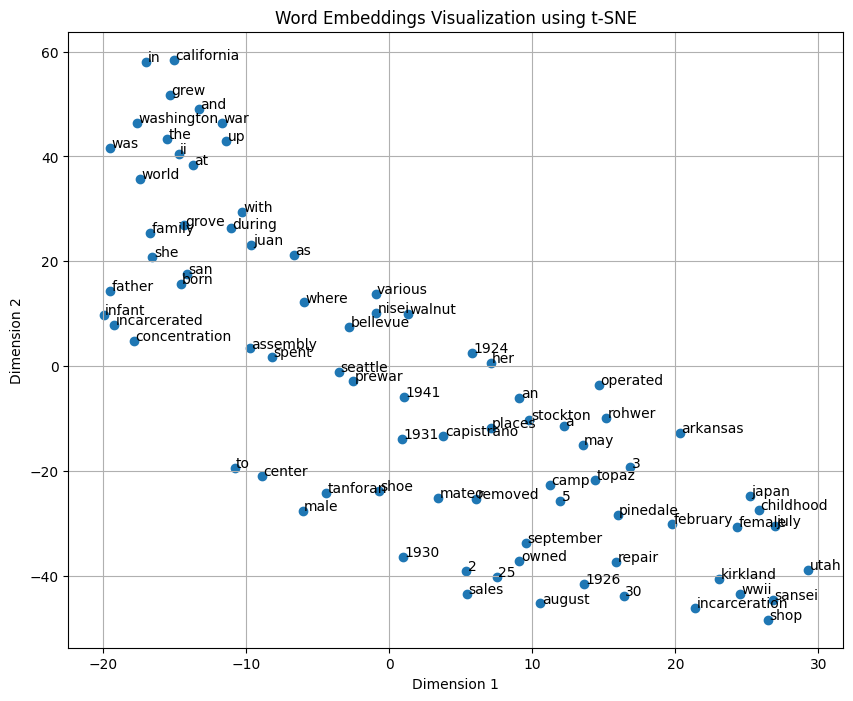

Cosine Similarity between 'nisei' and 'sansei': 0.7252
One or both words ('california', 'hawaii') not in vocabulary.
Cosine Similarity between 'war' and 'incarceration': 0.7841
One or both words ('japan', 'america') not in vocabulary.


In [21]:
# Write your code here
import re
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from gensim.models import Word2Vec
from scipy.spatial.distance import cosine
# Sample dataset of reviews
data = [
    "Nisei female. Born July 3, 1924, in Seattle, Washington. Spent prewar childhood in Japan; Bellevue, Washington; and Kirkland, Washington. Incarcerated at Pinedale Assembly Center, California.",
    "Sansei female. Born February 5, 1941, in Stockton, California. As an infant, she was incarcerated with her family at the Rohwer, Arkansas, concentration camp during WWII.",
    "Nisei male. Born September 25, 1926, in Walnut Grove, California. Grew up in Walnut Grove, where father owned and operated a shoe sales and repair shop.",
    "Nisei male. Born August 2, 1930, in San Mateo, California. During World War II, removed with family to the Tanforan Assembly Center, California, and the Topaz concentration camp, Utah.",
    "Nisei male. Born May 30, 1931, in San Juan Capistrano, California. Grew up in various places in California. During World War II, was removed with family to an incarceration camp.",
]


# Step 1: Preprocess the dataset
def preprocess_data(data):
    processed_data = []
    for review in data:
        # Clean and tokenize the text
        review = re.sub(r'\W+', ' ', review.lower().strip())  # Remove punctuation and lowercase
        tokens = review.split()
        processed_data.append(tokens)
    return processed_data

# Preprocessed dataset
processed_data = preprocess_data(data)

# Step 2: Train the Word2Vec model
embedding_size = 300
word2vec_model = Word2Vec(sentences=processed_data, vector_size=embedding_size, window=5, min_count=1, workers=4, epochs=100)

# Step 3: Visualize the word embeddings
# Retrieve the words and their corresponding vectors
words = list(word2vec_model.wv.key_to_index)
word_vectors = np.array([word2vec_model.wv[word] for word in words])

# Use t-SNE to reduce the dimensions of the word vectors to 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=5)
reduced_vectors = tsne.fit_transform(word_vectors)

# Plotting the word embeddings
plt.figure(figsize=(10, 8))
plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1])

# Adding the words to the plot
for i, word in enumerate(words):
    plt.annotate(word, (reduced_vectors[i, 0] + 0.1, reduced_vectors[i, 1] + 0.1), fontsize=10)  # Adjust label position slightly

plt.title('Word Embeddings Visualization using t-SNE')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.grid()
plt.show()

# Step 4: Calculate cosine similarity between word pairs
def cosine_similarity(word1, word2):
    vec1 = word2vec_model.wv[word1]
    vec2 = word2vec_model.wv[word2]
    return 1 - cosine(vec1, vec2)

# Example word pairs to check similarity
word_pairs = [("nisei", "sansei"), ("california", "hawaii"), ("war", "incarceration"), ("japan", "america")]

for word1, word2 in word_pairs:
    if word1 in word2vec_model.wv and word2 in word2vec_model.wv:
        similarity = cosine_similarity(word1, word2)
        print(f"Cosine Similarity between '{word1}' and '{word2}': {similarity:.4f}")
    else:
        print(f"One or both words ('{word1}', '{word2}') not in vocabulary.")




## Question 4 (20 Points)

**Create your own training and evaluation data for sentiment analysis.**

 **You don't need to write program for this question!**

 For example, if you collected a movie review or a product review data, then you can do the following steps:

*   Read each review (abstract or tweet) you collected in detail, and annotate each review with a sentiment (positive, negative, or neutral).

*   Save the annotated dataset into a csv file with three columns (first column: document_id, clean_text, sentiment), upload the csv file to GitHub and submit the file link blew.

*   This datset will be used for assignment four: sentiment analysis and text classification.




1.   Which NLP Task you would like perform on your selected dataset
(NER, Summarization, Sentiment Analysis, Text classficication)
2.  Explain your labeling Schema you have used and mention those labels

3.  You can take AI assistance for labeling the data only.



In [28]:
# The GitHub link of your final csv file

# Link:
import pandas as pd

# URL to my CSV file on GitHub
url = "https://raw.githubusercontent.com/anoohyabhaskarla/INFO_5731/refs/heads/main/sentiment_analysis_data.csv"

# Load the CSV file directly from GitHub
df = pd.read_csv(url)

# Display the first few rows of the dataset
print(df.head())





   document_id                                         clean_text sentiment
0            1  nisei femal born may selleck washington spent ...  positive
1            2  nisei male born june seattl washington grew ar...   neutral
2            3  nisei femal born octob seattl washington famil...  positive
3            4  nisei femal born juli boyl height california a...  positive
4            5  sansei male born march torranc california grew...   neutral


1.NLP Task to Perform:
The selected NLP tasks for the narrator dataset focus on Sentiment Analysis and Text Classification. Sentiment analysis aims to categorize each narrator’s bio into positive, negative, or neutral sentiment. Additionally, text classification is used to group narrators based on specific themes, such as historical context, profession, or life experiences.
2.Labeling Schema:
For Sentiment Analysis, each bio is labeled according to its emotional tone. A positive label is assigned to bios that convey optimism, inspiration, or uplifting content. Narratives that reflect hardships, struggles, or negative experiences are classified as negative. Meanwhile, bios that present neutral, factual information without strong emotional undertones are marked as neutral.
If Text Classification is applied, the dataset may also include additional categories based on the narrators backgrounds and experiences. These categories could include Immigrant Experience, Historical Figures, War Survivors, and Cultural Contributors. Each classification helps provide deeper insights into the themes and contexts surrounding the narrators' lives.
3. I used AI for labeling also crosschecked the samples of the results manually to ensure the consistency.

# Mandatory Question

Provide your thoughts on the assignment by filling this survey link. What did you find challenging, and what aspects did you enjoy? Your opinion on the provided time to complete the assignment.

# Type your answer
This assignment provided a practical introduction to natural language processing (NLP), exploring key topics such as sentiment dataset creation, TF-IDF, word embeddings, and N-gram analysis.
Challenges:Implementing N-gram counts, TF-IDF, and similarity metrics without libraries required a strong grasp of the underlying mathematical concepts. While challenging, it was a rewarding experience.
Manually annotating reviews for sentiment demanded significant time and patience.
I enjoyed Working directly with real-world text data was highly engaging.
Identifying common phrases using N-grams and leveraging embeddings to visualize word relationships felt like uncovering hidden narratives within the data.
Creating the labeled dataset provided a sense of contribution and accomplishment. Over all it took me 2 hrs to omplete the assessment